# Project Description

Insurance fraud is a huge problem in the industry. It's difficult to identify fraud claims. Machine Learning is in a unique position to help the Auto Insurance industry with this problem.  
  
In this project, you are provided a dataset which has the details of the insurance policy along with the customer details. It also has the details of the accident on the basis of which the claims have been made.  
  
In this example, you will be working with some auto insurance data to demonstrate how you can create a predictive model that predicts if an insurance claim is fraudulent or not.  

#### Independent Variables  
  
1. months_as_customer: Number of months of patronage  
2. age: the length of time a customer has lived or a thing has existed  
3. policy_number: It is a unique id given to the customer, to track the subscription status and other details of customer  
4. policy_bind_date:date which document that is given to customer after we accept your proposal for insurance  
5. policy_state: This identifies who is the insured, what risks or property are covered, the policy limits, and the policy period  
6. policy_csl: is basically Combined Single Limit  
7. policy_deductable: the amount of money that a customer is responsible for paying toward an insured loss  
8. policy_annual_premium: This means the amount of Regular Premium payable by the Policyholder in a Policy Year  
9. umbrella_limit: This means extra insurance that provides protection beyond existing limits and coverages of other policies  
10. insured_zip: It is the zip code where the insurance was made  
11. insured_sex: This refres to either of the two main categories (male and female) into which customer are divided on the basis of their reproductive functions  
12. insured_education_level: This refers to the Level of education of the customer  
13. insured_occupation: This refers Occupation of the customer  
14. insured_hobbies: This refers to an activity done regularly by customer in his/her leisure time for pleasure.  
15. insured_relationship: This whether customer is: single; or. married; or. in a de facto relationship (that is, living together but not married); or. in a civil partnership  
16. capital-gains: This refers to profit accrued due to insurance premium  
17. capital-loss: This refers to the losses incurred due to insurance claims  
18. incident_date: This refers to the date which claims where made by customers  
19. incident_type: This refers to the type of claim/vehicle damage made by customer  
20. collision_type: This refers to the area of damage on the vehicle  
21. incident_severity: This refers to the extent/level of damage  
22. authorities_contacted: This refers to the government agencies that were contacted after damage  
23. incident_state: This refers to the state at which the accident happened  
24. incident_city: This refers to the city at which the accident happened  
25. 1ncident_location: This refers to the location at which the accident happened  
26. incident_hour_of_the_day: The period of the day which accident took place  
27. number_of_vehicles_involved: This refers to number of vehicles involved the accident  
28. property_damage: This refers to whether property was damaged or not  
29. bodily_injuries: This refers to injuries sustained  
30. witnesses: This refers to the number of witnesses involved  
31. police_report_available: This refers to whether the report on damage was documented or not  
32. total_claim_amount: This refers to the financial implications involved in claims  
33. injury_claim: This refers to physical injuries sustained  
34. property_claim: This refers to property damages during incident  
35. vehicle_claim: This refers to property damages during incident  
36. auto_make: This refers to the make of the vehicle  
37. auto_model: This refers to the model of the vehicle  
38. auto_year: This refers to the year which the vehicle was manufactured  
39. _c39:  
40. fraud_reported

### Problem statement: In this dataset predict:

Is an insurance claim is fraudulent or not. 

## Importing Libraries & Data

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pylab as plt
import seaborn as sns

from sklearn import preprocessing
from sklearn import metrics
from sklearn.model_selection import train_test_split

import lazypredict

import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)

In [2]:
df = pd.read_csv('https://raw.githubusercontent.com/dsrscientist/Data-Science-ML-Capstone-Projects/master/Automobile_insurance_fraud.csv')

## Understanding the Data

In [3]:
df.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,25-01-2015,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,21-01-2015,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,22-02-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,10-01-2015,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,17-02-2015,Vehicle Theft,?,Minor Damage,NaN,NY,Arlington,3041 3rd Ave,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

In [5]:
df.describe()

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year,_c39
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000,0.0
mean,203.954000,38.948000,546238.648000,1136.000000,1256.406150,1.101000e+06,501214.488000,25126.100000,-26793.700000,11.644000,1.83900,0.992000,1.487000,52761.94000,7433.420000,7399.570000,37928.950000,2005.103000,NaN
std,115.113174,9.140287,257063.005276,611.864673,244.167395,2.297407e+06,71701.610941,27872.187708,28104.096686,6.951373,1.01888,0.820127,1.111335,26401.53319,4880.951853,4824.726179,18886.252893,6.015861,NaN
min,0.000000,19.000000,100804.000000,500.000000,433.330000,-1.000000e+06,430104.000000,0.000000,-111100.000000,0.000000,1.00000,0.000000,0.000000,100.00000,0.000000,0.000000,70.000000,1995.000000,NaN
25%,115.750000,32.000000,335980.250000,500.000000,1089.607500,0.000000e+00,448404.500000,0.000000,-51500.000000,6.000000,1.00000,0.000000,1.000000,41812.50000,4295.000000,4445.000000,30292.500000,2000.000000,NaN
50%,199.500000,38.000000,533135.000000,1000.000000,1257.200000,0.000000e+00,466445.500000,0.000000,-23250.000000,12.000000,1.00000,1.000000,1.000000,58055.00000,6775.000000,6750.000000,42100.000000,2005.000000,NaN
75%,276.250000,44.000000,759099.750000,2000.000000,1415.695000,0.000000e+00,603251.000000,51025.000000,0.000000,17.000000,3.00000,2.000000,2.000000,70592.50000,11305.000000,10885.000000,50822.500000,2010.000000,NaN
max,479.000000,64.000000,999435.000000,2000.000000,2047.590000,1.000000e+07,620962.000000,100500.000000,0.000000,23.000000,4.00000,2.000000,3.000000,114920.00000,21450.000000,23670.000000,79560.000000,2015.000000,NaN


In [6]:
df.isnull().sum()

months_as_customer                0
age                               0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                    0
incident_severity                 0
authorities_contacted            91
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage             

In [7]:
df['authorities_contacted'].value_counts()

authorities_contacted
Police       292
Fire         223
Other        198
Ambulance    196
Name: count, dtype: int64

In [8]:
for i in df.columns:
    if df[i].dtypes == 'object':
        print(df[i].value_counts())

policy_bind_date
01-01-2006    3
28-04-1992    3
05-08-1992    3
14-12-1991    2
09-08-2004    2
             ..
03-06-2014    1
12-12-1998    1
18-02-1999    1
30-10-1997    1
11-11-1996    1
Name: count, Length: 951, dtype: int64
policy_state
OH    352
IL    338
IN    310
Name: count, dtype: int64
policy_csl
250/500     351
100/300     349
500/1000    300
Name: count, dtype: int64
insured_sex
FEMALE    537
MALE      463
Name: count, dtype: int64
insured_education_level
JD             161
High School    160
Associate      145
MD             144
Masters        143
PhD            125
College        122
Name: count, dtype: int64
insured_occupation
machine-op-inspct    93
prof-specialty       85
tech-support         78
sales                76
exec-managerial      76
craft-repair         74
transport-moving     72
other-service        71
priv-house-serv      71
armed-forces         69
adm-clerical         65
protective-serv      63
handlers-cleaners    54
farming-fishing      53
Name: coun

## Preparation of the Data

In [9]:
df = df.drop(['_c39', 'policy_number', 'incident_location'], axis=1)

In [10]:
authorities_contacted_na = (df.query('authorities_contacted.isna()', engine='python'))
authorities_contacted_na

,months_as_customer,age,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
4,228,44,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,17-02-2015,Vehicle Theft,?,Minor Damage,NaN,NY,Arlington,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N
13,121,34,26-10-2012,OH,100/300,1000,936.61,0,464652,FEMALE,MD,armed-forces,bungie-jumping,wife,52800,-32800,08-01-2015,Parked Car,?,Minor Damage,NaN,SC,Springfield,5,1,NO,1,1,NO,7280,1120,1120,5040,Toyota,Highlander,2010,N
27,202,34,18-07-2002,IN,100/300,500,848.07,3000000,607730,MALE,JD,exec-managerial,chess,not-in-family,31000,-30200,07-01-2015,Vehicle Theft,?,Minor Damage,NaN,VA,Northbrook,5,1,YES,2,1,?,5720,1040,520,4160,Suburu,Forrestor,2003,Y
37,289,49,03-02-1993,IL,500/1000,2000,1222.48,0,620757,FEMALE,JD,priv-house-serv,golf,unmarried,0,0,18-01-2015,Parked Car,?,Minor Damage,NaN,WV,Arlington,16,1,NO,1,1,YES,5330,1230,820,3280,Suburu,Legacy,2001,N
51,91,27,20-08-1994,IL,100/300,2000,1073.83,0,609930,FEMALE,JD,farming-fishing,polo,husband,0,0,17-01-2015,Vehicle Theft,?,Trivial Damage,NaN,NY,Arlington,4,1,?,1,2,?,7260,1320,660,5280,BMW,M5,2008,N
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
940,308,47,16-09-2013,OH,100/300,1000,1013.61,6000000,452349,FEMALE,Associate,craft-repair,movies,own-child,45700,-41400,03-01-2015,Parked Car,?,Minor Damage,NaN,NY,Springfield,7,1,?,1,1,YES,5590,860,860,3870,Suburu,Impreza,2002,N
942,108,31,04-01-2002,IN,250/500,2000,1112.04,6000000,472209,FEMALE,PhD,other-service,base-jumping,own-child,52800,-54300,13-01-2015,Parked Car,?,Minor Damage,NaN,SC,Arlington,5,1,NO,1,3,NO,4290,780,780,2730,Volkswagen,Passat,1998,N
950,101,27,23-11-1997,IL,500/1000,500,982.70,6000000,440865,FEMALE,College,transport-moving,video-games,unmarried,30800,-43700,13-01-2015,Parked Car,?,Minor Damage,NaN,SC,Arlington,9,1,NO,1,0,NO,5170,940,470,3760,Toyota,Camry,2001,N
953,229,43,18-06-1997,IN,250/500,2000,1585.54,0,463153,MALE,High School,protective-serv,reading,not-in-family,42600,-44400,26-02-2015,Vehicle Theft,?,Minor Damage,NaN,WV,Hillsdale,3,1,NO,1,0,YES,4620,420,840,3360,Volkswagen,Jetta,2012,N


In [11]:
df['authorities_contacted'] = df['authorities_contacted'].fillna('Police')

In [12]:
df['policy_bind_date'] = pd.to_datetime(df['policy_bind_date'])
df['policy_bind_day'] = df['policy_bind_date'].dt.day
df['policy_bind_month'] = df['policy_bind_date'].dt.month
df['policy_bind_year'] = df['policy_bind_date'].dt.year


df['incident_date'] = pd.to_datetime(df['incident_date'])
df['incident_day'] = df['incident_date'].dt.day
df['incident_month'] = df['incident_date'].dt.month
df['incident_year'] = df['incident_date'].dt.year

df = df.drop(['policy_bind_date', 'incident_date'], axis=1)

In [13]:
df.head()

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,policy_bind_day,policy_bind_month,policy_bind_year,incident_day,incident_month,incident_year
0,328,48,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y,17,10,2014,25,1,2015
1,228,42,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y,27,6,2006,21,1,2015
2,134,29,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,6,9,2000,22,2,2015
3,256,41,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,25,5,1990,10,1,2015
4,228,44,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,Vehicle Theft,?,Minor Damage,Police,NY,Arlington,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N,6,6,2014,17,2,2015


In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 41 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_state                 1000 non-null   object 
 3   policy_csl                   1000 non-null   object 
 4   policy_deductable            1000 non-null   int64  
 5   policy_annual_premium        1000 non-null   float64
 6   umbrella_limit               1000 non-null   int64  
 7   insured_zip                  1000 non-null   int64  
 8   insured_sex                  1000 non-null   object 
 9   insured_education_level      1000 non-null   object 
 10  insured_occupation           1000 non-null   object 
 11  insured_hobbies              1000 non-null   object 
 12  insured_relationship         1000 non-null   object 
 13  capital-gains      

## Understanding Features

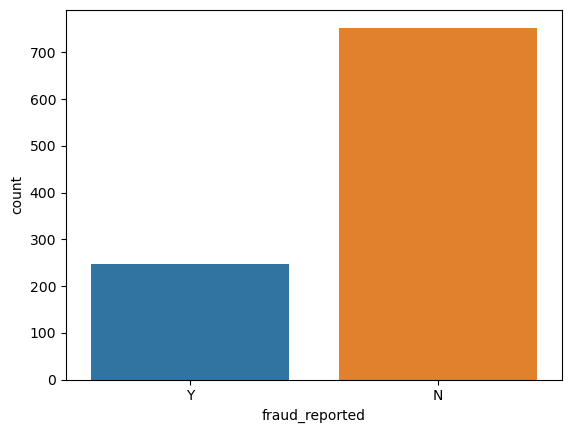

In [15]:
sns.countplot(x='fraud_reported', data=df);

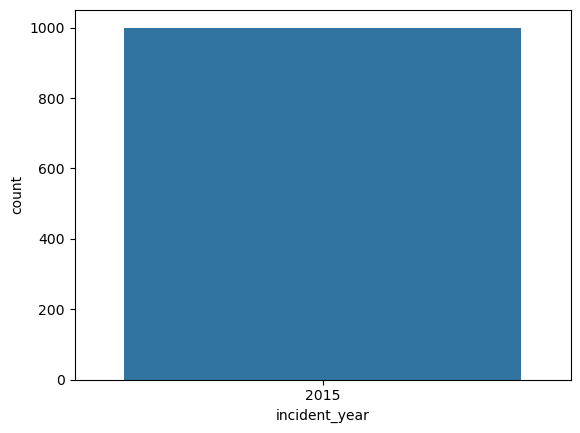

In [16]:
sns.countplot(x='incident_year', data=df);

In [17]:
df = df.drop(['incident_year'], axis=1)

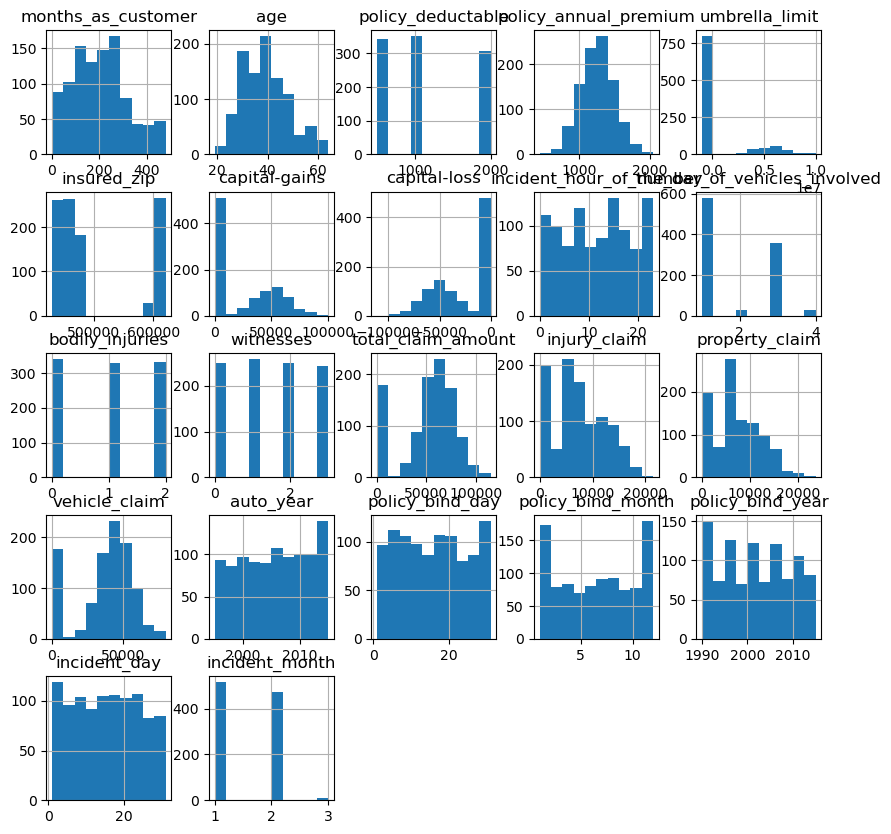

In [18]:
df.hist(bins=10,figsize=(10,10));

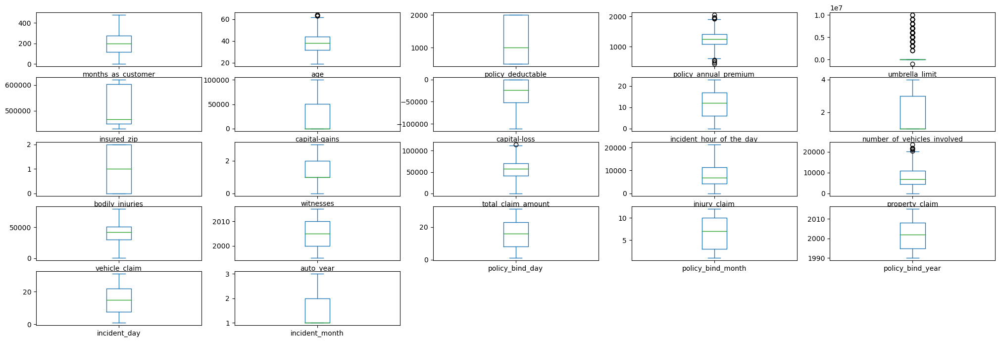

In [19]:
df.plot(kind='box',subplots=True,layout=(9,5),figsize=(25,15));

## Understanding Feature Relationships

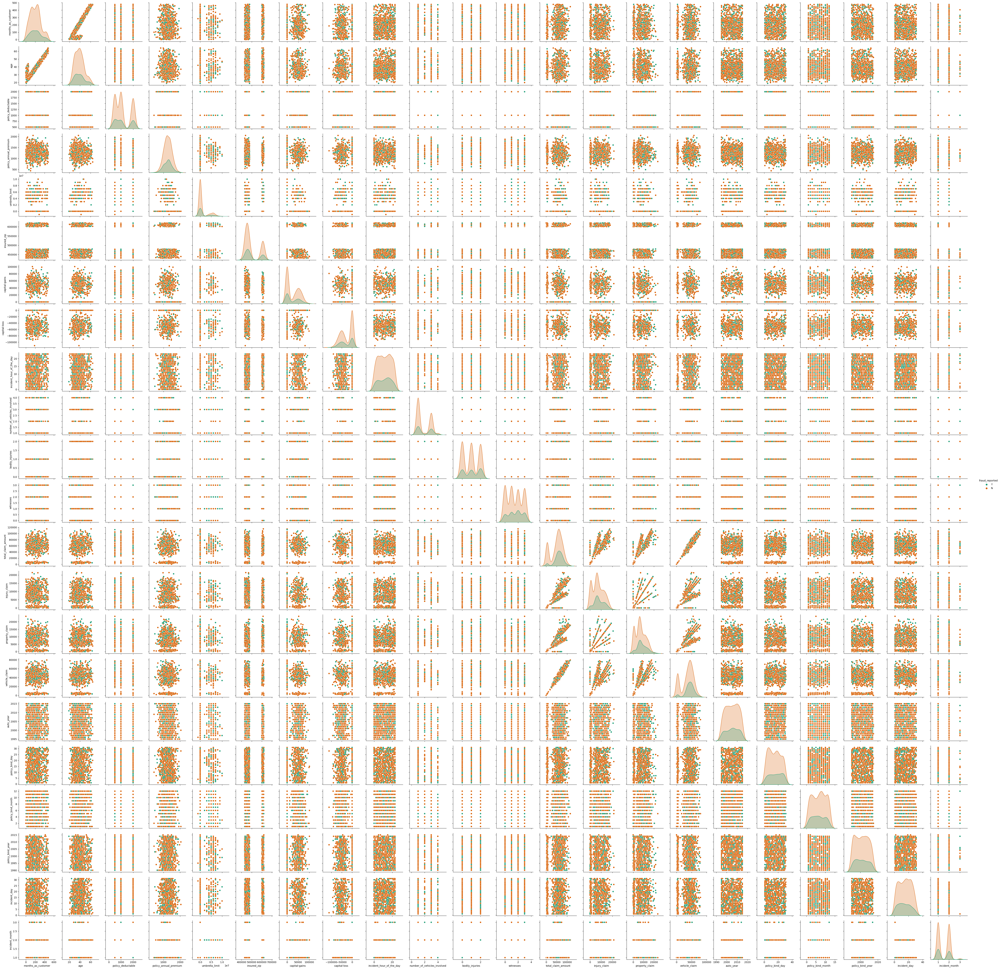

In [20]:
sns.pairplot(df, palette="Dark2", hue='fraud_reported');

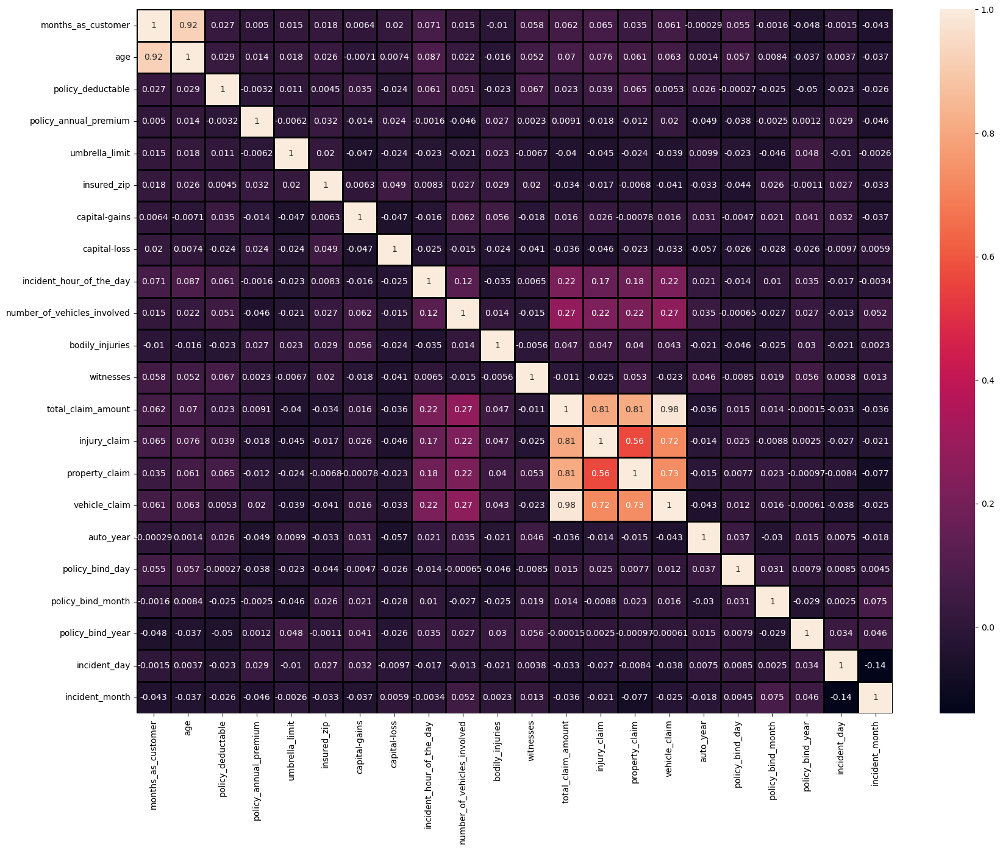

In [21]:
plt.figure(figsize=(20,15))
sns.heatmap(df.corr(numeric_only=True), annot=True, linewidths=1, linecolor='black');

In [22]:
from sklearn.preprocessing import OrdinalEncoder
OE = OrdinalEncoder()
for i in df.columns:
    if df[i].dtypes == 'object':
        df[i] = OE.fit_transform(df[i].values.reshape(-1, 1))
df

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,policy_bind_day,policy_bind_month,policy_bind_year,incident_day,incident_month
0,328,48,2.0,1.0,1000,1406.91,0,466132,1.0,4.0,2.0,17.0,0.0,53300,0,2.0,3.0,0.0,3.0,4.0,1.0,5,1,2.0,1,2,2.0,71610,6510,13020,52080,10.0,1.0,2004,1.0,17,10,2014,25,1
1,228,42,1.0,1.0,2000,1197.22,5000000,468176,1.0,4.0,6.0,15.0,2.0,0,0,3.0,0.0,1.0,3.0,5.0,5.0,8,1,0.0,0,0,0.0,5070,780,780,3510,8.0,12.0,2007,1.0,27,6,2006,21,1
2,134,29,2.0,0.0,2000,1413.14,5000000,430632,0.0,6.0,11.0,2.0,3.0,35100,0,0.0,2.0,1.0,3.0,1.0,1.0,7,3,1.0,2,3,1.0,34650,7700,3850,23100,4.0,30.0,2007,0.0,6,9,2000,22,2
3,256,41,0.0,1.0,2000,1415.74,6000000,608117,0.0,6.0,1.0,2.0,4.0,48900,-62400,2.0,1.0,0.0,3.0,2.0,0.0,5,1,0.0,1,2,1.0,63400,6340,6340,50720,3.0,34.0,2014,1.0,25,5,1990,10,1
4,228,44,0.0,2.0,1000,1583.91,6000000,610706,1.0,0.0,11.0,2.0,4.0,66000,-46000,3.0,0.0,1.0,3.0,1.0,0.0,20,1,1.0,0,1,1.0,6500,1300,650,4550,0.0,31.0,2009,0.0,6,6,2014,17,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,2.0,2.0,1000,1310.80,0,431289,0.0,5.0,2.0,13.0,4.0,0,0,2.0,1.0,1.0,1.0,0.0,4.0,20,1,2.0,0,1,0.0,87200,17440,8720,61040,6.0,6.0,2006,0.0,16,7,1991,22,2
996,285,41,0.0,0.0,1000,1436.79,0,608177,0.0,6.0,9.0,17.0,5.0,70900,0,2.0,2.0,0.0,1.0,4.0,3.0,23,1,2.0,2,3,0.0,108480,18080,18080,72320,13.0,28.0,2015,0.0,5,1,2014,24,1
997,130,34,2.0,1.0,500,1383.49,3000000,442797,0.0,5.0,1.0,3.0,2.0,35100,0,0.0,3.0,1.0,3.0,0.0,0.0,4,3,0.0,2,3,2.0,67500,7500,7500,52500,11.0,19.0,1996,0.0,17,2,2003,23,1
998,458,62,0.0,2.0,2000,1356.92,5000000,441714,1.0,0.0,5.0,0.0,5.0,0,0,2.0,2.0,0.0,2.0,1.0,0.0,2,1,0.0,0,1,2.0,46980,5220,5220,36540,1.0,5.0,1998,0.0,18,11,2011,26,2


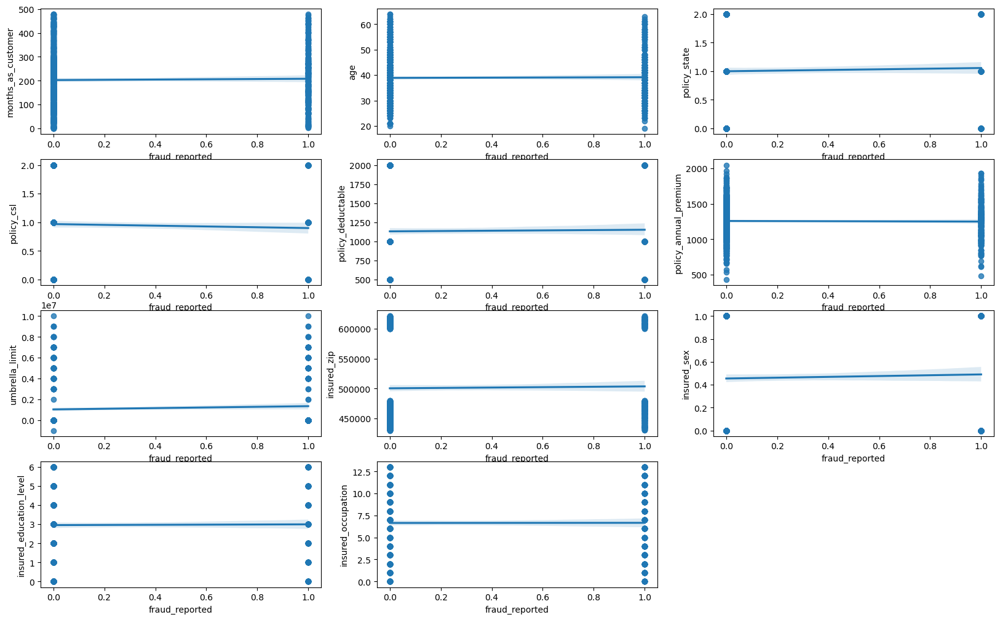

In [23]:
plt.figure(figsize=(20,25))
p=1
for i in df:
    if p<=11:
        plt.subplot(8,3,p)
        sns.regplot(x='fraud_reported', y=i, data=df)
        plt.xlabel('fraud_reported')
        plt.ylabel(i)
    p+=1
plt.show()

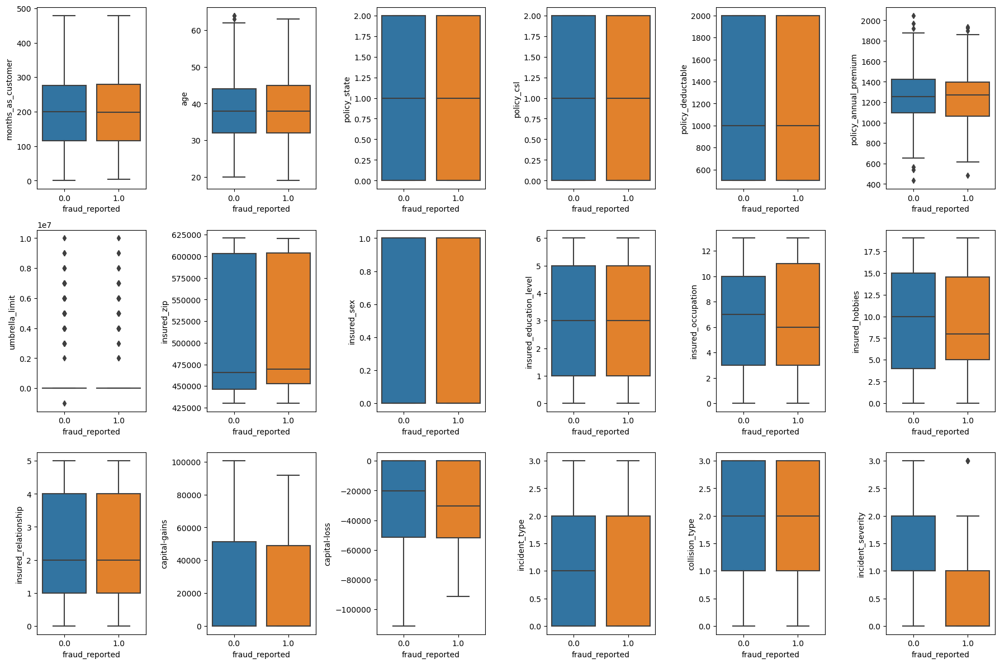

In [24]:
fig, axs = plt.subplots(3, 6, figsize=(18,12))
features = df.drop('fraud_reported', axis=1).columns
for i, ax in enumerate(axs.flatten()):
    sns.boxplot(x='fraud_reported', y=features[i], data=df, ax=ax)
plt.tight_layout()
plt.show()

## Model Preparation

In [25]:
df_skew = df.skew()
df_skew

months_as_customer             0.362177
age                            0.478988
policy_state                  -0.026177
policy_csl                     0.088928
policy_deductable              0.477887
policy_annual_premium          0.004402
umbrella_limit                 1.806712
insured_zip                    0.816554
insured_sex                    0.148630
insured_education_level       -0.000148
insured_occupation            -0.058881
insured_hobbies               -0.061563
insured_relationship           0.077488
capital-gains                  0.478850
capital-loss                  -0.391472
incident_type                  0.101507
collision_type                -0.193345
incident_severity              0.279016
authorities_contacted         -0.301862
incident_state                -0.148865
incident_city                  0.049531
incident_hour_of_the_day      -0.035584
number_of_vehicles_involved    0.502664
property_damage                0.106418
bodily_injuries                0.014777


In [26]:
for index, value in df_skew.items():
    if value > 0.5 or value < -0.5:
        df[index] = np.cbrt(df[index])
df.skew()

months_as_customer             0.362177
age                            0.478988
policy_state                  -0.026177
policy_csl                     0.088928
policy_deductable              0.477887
policy_annual_premium          0.004402
umbrella_limit                 1.523380
insured_zip                    0.794586
insured_sex                    0.148630
insured_education_level       -0.000148
insured_occupation            -0.058881
insured_hobbies               -0.061563
insured_relationship           0.077488
capital-gains                  0.478850
capital-loss                  -0.391472
incident_type                  0.101507
collision_type                -0.193345
incident_severity              0.279016
authorities_contacted         -0.301862
incident_state                -0.148865
incident_city                  0.049531
incident_hour_of_the_day      -0.035584
number_of_vehicles_involved    0.422815
property_damage                0.106418
bodily_injuries                0.014777


In [27]:
x = df.drop(['fraud_reported'], axis=1)
y = df[['fraud_reported']]

In [28]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
                        for i in range(len(x.columns))]
vif["Features"] = x.columns

vif

,VIF values,Features
0,28.446159,months_as_customer
1,131.743841,age
2,2.575238,policy_state
3,2.465065,policy_csl
4,4.631189,policy_deductable
5,28.621418,policy_annual_premium
6,1.289494,umbrella_limit
7,483.917749,insured_zip
8,1.920538,insured_sex
9,3.473385,insured_education_level


In [29]:
scaler = preprocessing.StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x), columns = x.columns)

In [30]:
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
                        for i in range(len(x.columns))]
vif["Features"] = x.columns

vif

,VIF values,Features
0,6.868734,months_as_customer
1,6.870448,age
2,1.034106,policy_state
3,1.030857,policy_csl
4,1.041374,policy_deductable
5,1.041501,policy_annual_premium
6,1.036267,umbrella_limit
7,1.037553,insured_zip
8,1.034144,insured_sex
9,1.048907,insured_education_level


In [31]:
df = df.drop(['total_claim_amount'], axis=1)

In [32]:
xtrain,xtest,ytrain,ytest = train_test_split(x,y,test_size = .25, random_state = 39)

## Model Creation

In [33]:
from lazypredict.Supervised import LazyClassifier

clf = LazyClassifier(verbose = 0, ignore_warnings=True, custom_metric=None)
models, prediction = clf.fit(xtrain, xtest, ytrain, ytest)
print(models);

 93%|█████████▎| 27/29 [00:03<00:00,  9.15it/s]

[LightGBM] [Info] Number of positive: 186, number of negative: 564
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002379 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2386
[LightGBM] [Info] Number of data points in the train set: 750, number of used features: 39
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.248000 -> initscore=-1.109308
[LightGBM] [Info] Start training from score -1.109308
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

100%|██████████| 29/29 [00:04<00:00,  6.72it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
                               Accuracy  Balanced Accuracy  ROC AUC  F1 Score  \
Model                                                                           
BaggingClassifier                  0.84               0.76     0.76      0.83   
XGBClas

## Model Evaluation

In [34]:
from xgboost import XGBClassifier
XGB_clf = XGBClassifier(random_state = 39)

In [35]:
XGB_clf.fit(xtrain,ytrain)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=39, ...)

In [36]:
grid_param = {'max_depth': range (2, 10, 1),
              'n_estimators': range(60, 220, 40),
              'learning_rate': [0.1, 0.01, 0.05]}

In [37]:
from sklearn.model_selection import GridSearchCV
grid_search = GridSearchCV(estimator=XGB_clf, param_grid=grid_param, cv=2, verbose=3)

In [38]:
grid_search.fit(xtrain,ytrain)

Fitting 2 folds for each of 96 candidates, totalling 192 fits
[CV 1/2] END learning_rate=0.1, max_depth=2, n_estimators=60;, score=0.800 total time=   0.0s
[CV 2/2] END learning_rate=0.1, max_depth=2, n_estimators=60;, score=0.808 total time=   0.0s
[CV 1/2] END learning_rate=0.1, max_depth=2, n_estimators=100;, score=0.792 total time=   0.0s
[CV 2/2] END learning_rate=0.1, max_depth=2, n_estimators=100;, score=0.808 total time=   0.0s
[CV 1/2] END learning_rate=0.1, max_depth=2, n_estimators=140;, score=0.787 total time=   0.1s
[CV 2/2] END learning_rate=0.1, max_depth=2, n_estimators=140;, score=0.808 total time=   0.1s
[CV 1/2] END learning_rate=0.1, max_depth=2, n_estimators=180;, score=0.792 total time=   0.1s
[CV 2/2] END learning_rate=0.1, max_depth=2, n_estimators=180;, score=0.824 total time=   0.1s
[CV 1/2] END learning_rate=0.1, max_depth=3, n_estimators=60;, score=0.803 total time=   0.0s
[CV 2/2] END learning_rate=0.1, max_depth=3, n_estimators=60;, score=0.797 total time=

GridSearchCV(cv=2,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     gpu_id=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_cat_threshold=None,
                                     max_cat_to_onehot=None,
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None, predictor=None,
                                     random_state=39, ...),
             param_grid={'learning_rate': [0.1, 0.01, 0.05],
                         'max_depth': range(2, 10),
                         'n_estimators': range(60, 220, 40)},
             verbose=3)

In [39]:
grid_search.best_params_

{'learning_rate': 0.01, 'max_depth': 7, 'n_estimators': 60}

## Final Model

When comparing models XGBClassifier had the second highest accuracy at 0.84, balanced accuracy at 0.74, ROC AUC of 0.74, and F1 Score 0.83. It did have a longer training time of 0.14 than the 0.083 of the BaggingClassifier, but I chose XGBClassifier for the ability to use hyperparameter tuning to increase the score.

In [40]:
Final_model = XGBClassifier(learning_rate=0.01, max_depth=7, n_estimators=60, random_state=39)

In [41]:
from sklearn.metrics import accuracy_score

Final_model.fit(xtrain,ytrain)
pred = Final_model.predict(xtest)
acc = accuracy_score(ytest,pred)
print(acc*100)

86.8
